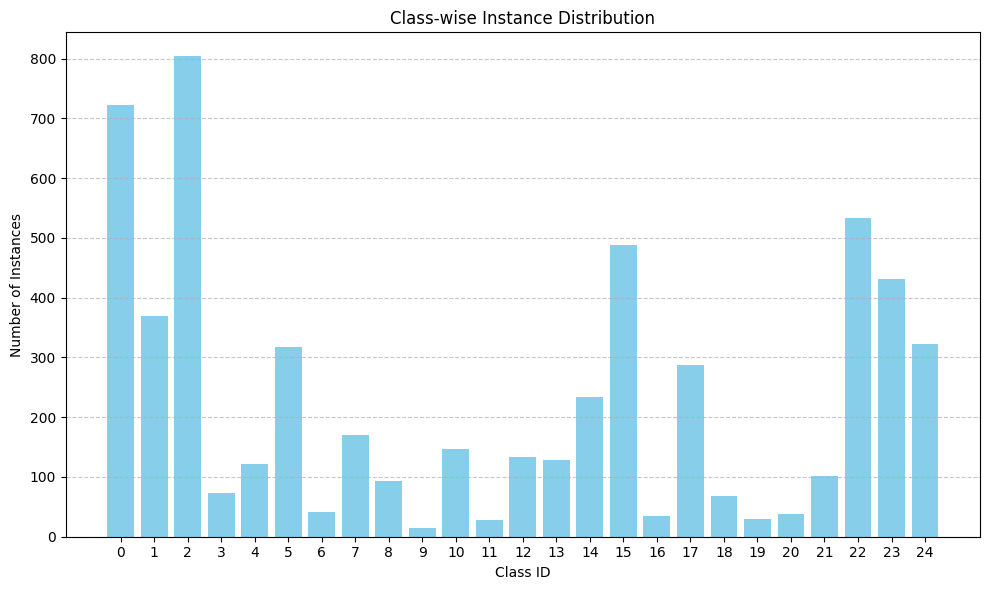

In [1]:
import os
from collections import defaultdict
import matplotlib.pyplot as plt

# Set your dataset paths
labels_dir = '/kaggle/input/taco-modified/labels'

# Dictionary to hold class-wise instance counts
class_distribution = defaultdict(int)

# Read all label files
for filename in os.listdir(labels_dir):
    if filename.endswith('.txt'):
        file_path = os.path.join(labels_dir, filename)
        with open(file_path, 'r') as f:
            for line in f:
                if line.strip():  # skip empty lines
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    class_distribution[class_id] += 1

# Sort the class IDs
sorted_class_ids = sorted(class_distribution.keys())
counts = [class_distribution[class_id] for class_id in sorted_class_ids]

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(sorted_class_ids, counts, color='skyblue')
plt.xlabel('Class ID')
plt.ylabel('Number of Instances')
plt.title('Class-wise Instance Distribution')
plt.xticks(sorted_class_ids)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [2]:
print(class_distribution)

defaultdict(<class 'int'>, {2: 804, 22: 534, 1: 370, 5: 318, 15: 489, 23: 432, 24: 322, 7: 170, 0: 722, 8: 94, 14: 234, 6: 42, 21: 101, 10: 147, 19: 29, 12: 134, 3: 74, 20: 38, 13: 129, 18: 68, 4: 122, 17: 288, 11: 28, 9: 14, 16: 34})


In [3]:
import os
import cv2
import albumentations as A
from tqdm import tqdm
from collections import defaultdict

# ========== CONFIG ==========

ORIG_IMAGES_DIR = '/kaggle/input/taco-modified/images'
ORIG_LABELS_DIR = '/kaggle/input/taco-modified/labels'
OUTPUT_IMAGES_DIR = 'balanced_dataset/images'
OUTPUT_LABELS_DIR = 'balanced_dataset/labels'
INSTANCE_THRESHOLD = 100   # Below this, classes will be augmented
AUG_PER_IMAGE = 5          # Number of augmentations per rare image

# Create output dirs
os.makedirs(OUTPUT_IMAGES_DIR, exist_ok=True)
os.makedirs(OUTPUT_LABELS_DIR, exist_ok=True)

# Pixel-only augmentations (no spatial transforms!)

pixel_aug = A.Compose([
    A.ColorJitter(brightness=0.3, contrast=0.2, saturation=0.1, hue=0.05, p=0.7),
    A.GaussNoise(std_range=(0.3, 0.45), mean_range=(0.0, 0.0), per_channel=True, noise_scale_factor=0.7, p=0.5),
    A.MotionBlur(blur_limit=(3, 5), p=0.3),
    A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=0.4),
    A.ImageCompression(quality_range=(30, 60), compression_type="jpeg", p=0.4),
    A.Downscale(
        scale_range=(0.4, 0.8),
        interpolation_pair={
            "downscale": cv2.INTER_AREA,
            "upscale": cv2.INTER_LINEAR
        },
        p=0.4
    ),
])


# ========== STEP 1: Analyze Class Distribution ==========

class_counts = defaultdict(int)

for file in os.listdir(ORIG_LABELS_DIR):
    with open(os.path.join(ORIG_LABELS_DIR, file), 'r') as f:
        for line in f:
            if line.strip():
                class_id = int(line.strip().split()[0])
                class_counts[class_id] += 1

rare_classes = {cls for cls, count in class_counts.items() if count < INSTANCE_THRESHOLD}
print(f"Rare classes: {rare_classes}")

# ========== STEP 2: Copy Originals ==========

for file in os.listdir(ORIG_IMAGES_DIR):
    img_path = os.path.join(ORIG_IMAGES_DIR, file)
    label_path = os.path.join(ORIG_LABELS_DIR, file.replace('.jpg', '.txt'))

    if not os.path.exists(label_path):
        continue

    os.system(f'cp "{img_path}" "{os.path.join(OUTPUT_IMAGES_DIR, file)}"')
    os.system(f'cp "{label_path}" "{os.path.join(OUTPUT_LABELS_DIR, file.replace(".jpg", ".txt"))}"')

# ========== STEP 3: Pixel-level Augmentation for Rare Classes ==========

for file in tqdm(os.listdir(ORIG_LABELS_DIR), desc="Applying pixel-level augmentations"):
    label_path = os.path.join(ORIG_LABELS_DIR, file)
    image_file = file.replace('.txt', '.jpg')
    image_path = os.path.join(ORIG_IMAGES_DIR, image_file)

    if not os.path.exists(image_path):
        continue

    with open(label_path, 'r') as f:
        lines = f.readlines()

    # Skip images with no rare class
    if not any(int(line.split()[0]) in rare_classes for line in lines):
        continue

    image = cv2.imread(image_path)
    if image is None:
        continue

    for i in range(AUG_PER_IMAGE):
        augmented = pixel_aug(image=image)
        aug_img = augmented['image']

        # Save augmented image
        new_name = f"{file.replace('.txt', '')}_webcam_{i}"
        cv2.imwrite(os.path.join(OUTPUT_IMAGES_DIR, new_name + ".jpg"), aug_img)

        # Copy label file as-is
        with open(os.path.join(OUTPUT_LABELS_DIR, new_name + ".txt"), 'w') as f_out:
            f_out.writelines(lines)


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.6' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Rare classes: {3, 6, 8, 9, 11, 16, 18, 19, 20}


Applying pixel-level augmentations: 100%|██████████| 1810/1810 [00:51<00:00, 35.21it/s]


In [4]:
import os

def check_images_and_labels(images_dir, labels_dir):
    # Get list of files in each directory
    image_files = [f for f in os.listdir(images_dir) if os.path.isfile(os.path.join(images_dir, f))]
    label_files = [f for f in os.listdir(labels_dir) if os.path.isfile(os.path.join(labels_dir, f))]

    # Print number of files
    print(f"Number of image files: {len(image_files)}")
    print(f"Number of label files: {len(label_files)}")

    # Extract base names (without extension) for comparison
    image_basenames = {os.path.splitext(f)[0] for f in image_files}
    label_basenames = {os.path.splitext(f)[0] for f in label_files}

    # Find missing labels
    missing_labels = image_basenames - label_basenames

    if missing_labels:
        print("Images missing corresponding .txt label files:")
        for name in sorted(missing_labels):
            print(f"- {name}")
    else:
        print("All images have corresponding label files.")

# Example usage
images_dir = 'balanced_dataset/images'
labels_dir = 'balanced_dataset/labels'
check_images_and_labels(images_dir, labels_dir)


Number of image files: 3395
Number of label files: 3395
All images have corresponding label files.


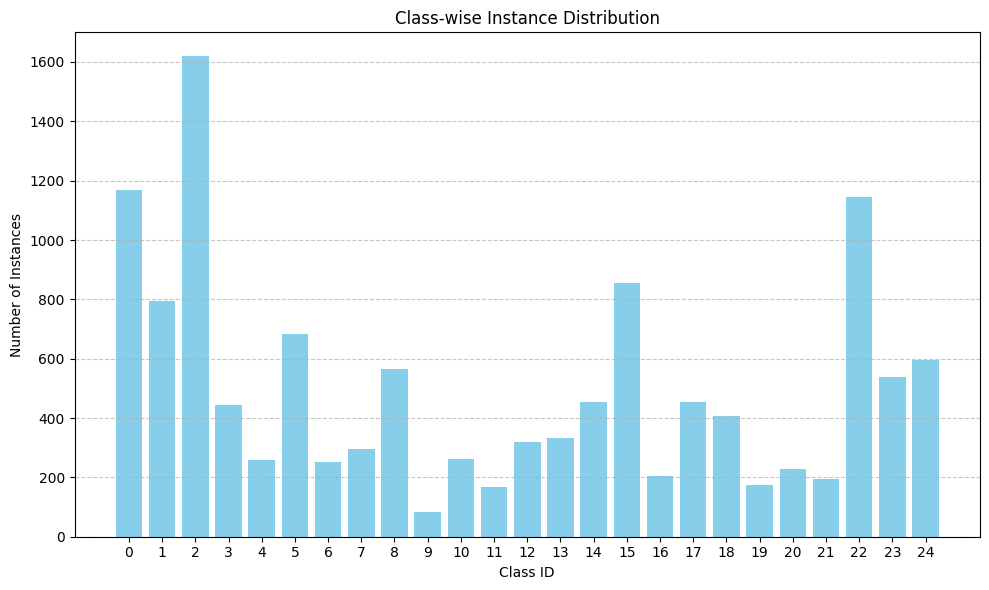

In [5]:
# Dictionary to hold class-wise instance counts
class_distribution = defaultdict(int)

# Read all label files
for filename in os.listdir(labels_dir):
    if filename.endswith('.txt'):
        file_path = os.path.join(labels_dir, filename)
        with open(file_path, 'r') as f:
            for line in f:
                if line.strip():  # skip empty lines
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    class_distribution[class_id] += 1

# Sort the class IDs
sorted_class_ids = sorted(class_distribution.keys())
counts = [class_distribution[class_id] for class_id in sorted_class_ids]

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(sorted_class_ids, counts, color='skyblue')
plt.xlabel('Class ID')
plt.ylabel('Number of Instances')
plt.title('Class-wise Instance Distribution')
plt.xticks(sorted_class_ids)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [6]:
print(class_distribution)

defaultdict(<class 'int'>, {19: 174, 1: 795, 20: 228, 23: 537, 13: 334, 2: 1619, 4: 257, 12: 319, 22: 1144, 5: 683, 3: 444, 21: 196, 15: 854, 17: 453, 0: 1167, 11: 168, 8: 564, 14: 454, 24: 597, 18: 408, 6: 252, 7: 295, 16: 204, 10: 262, 9: 84})


In [7]:
id_to_name={0: 'Cigarette', 1: 'Plastic bottle', 2: 'Plastic wrapper', 3: 'Plastic container', 4: 'Plastic cup', 5: 'Plastic lid/cap', 6: 'Plastic utensil', 7: 'Plastic straw', 8: 'Plastic bag', 9: 'Plastic gloves', 10: 'Foam container', 11: 'Paper straw', 12: 'Paper', 13: 'Paper container', 14: 'Carton', 15: 'Metal can/lid', 16: 'Scrap metal', 17: 'Glass', 18: 'Aluminium/foil', 19: 'Rope/string', 20: 'Aerosol', 21: 'Tissues', 22: 'Unlabeled litter', 23: 'Food waste', 24: 'Other'}

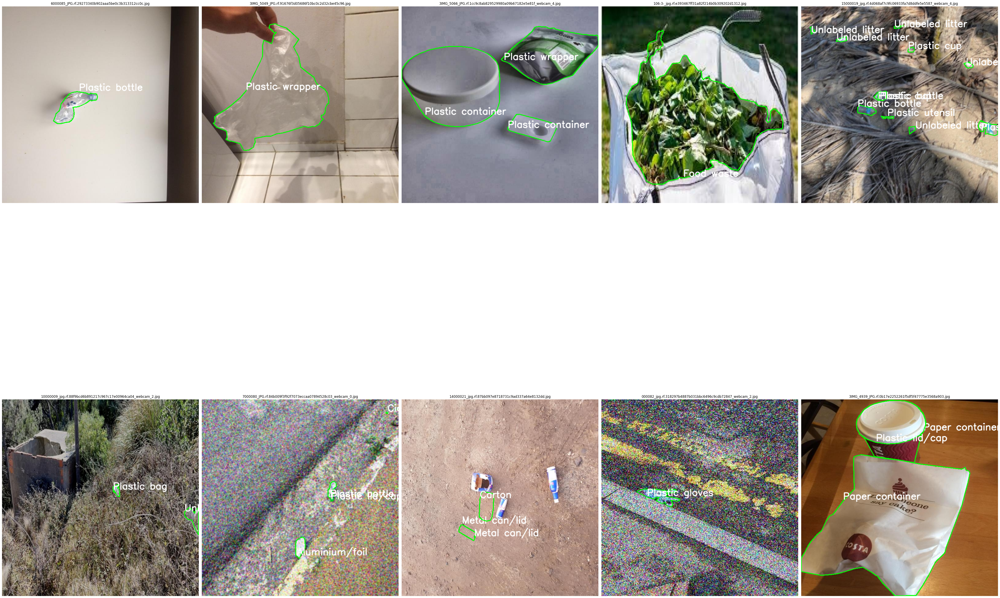

In [8]:
import os
import random
import cv2
import matplotlib.pyplot as plt
import numpy as np

# === Paths ===
image_dir = 'balanced_dataset/images'
label_dir = 'balanced_dataset/labels'

# === Parameters ===
num_samples = 10

# === Get image-label pairs ===
image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
random.shuffle(image_files)
sampled_files = image_files[:num_samples]

# === Drawing function ===
def draw_polygons_on_image(image_path, label_path):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Could not load image: {image_path}")
        return None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w = image.shape[:2]

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) < 3:
                    continue

                class_id = int(parts[0])
                coords = list(map(float, parts[1:]))

                if len(coords) % 2 != 0:
                    continue  # Invalid polygon

                pts = [(int(coords[i] * w), int(coords[i + 1] * h)) for i in range(0, len(coords), 2)]
                pts_np = np.array(pts, np.int32).reshape((-1, 1, 2))

                # Draw polygon outline
                cv2.polylines(image, [pts_np], isClosed=True, color=(0, 255, 0), thickness=2)

                # Put class name at the first point
                label = id_to_name.get(class_id, f"ID {class_id}")
                x, y = pts[0]
                cv2.putText(image, label, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

    return image

# === Visualize ===
fig, axs = plt.subplots(2, 5, figsize=(50,50))
axs = axs.flatten()

for idx, filename in enumerate(sampled_files):
    image_path = os.path.join(image_dir, filename)
    label_path = os.path.join(label_dir, os.path.splitext(filename)[0] + '.txt')

    result_img = draw_polygons_on_image(image_path, label_path)

    if result_img is not None:
        axs[idx].imshow(result_img)
        axs[idx].set_title(filename)
        axs[idx].axis('off')

plt.tight_layout()
plt.show()


In [9]:
!pip install scikit-multilearn

In [10]:
!pip install iterative-stratification

In [11]:
import os
import shutil
import random
from tqdm import tqdm
from sklearn.preprocessing import MultiLabelBinarizer
from iterstrat.ml_stratifiers import MultilabelStratifiedShuffleSplit

def get_image_classes(label_path):
    """Read classes in a YOLO label file."""
    classes = set()
    with open(label_path, 'r') as f:
        for line in f:
            if line.strip():
                cls_id = int(line.split()[0])
                classes.add(cls_id)
    return classes

def stratified_split(
    source_dir,
    output_dir,
    train_ratio=0.7,
    val_ratio=0.2,
    test_ratio=0.1,
    seed=42
):
    assert abs(train_ratio + val_ratio + test_ratio - 1.0) < 1e-6, "Ratios must sum to 1.0"

    images_dir = os.path.join(source_dir, "images")
    labels_dir = os.path.join(source_dir, "labels")

    image_files = [f for f in os.listdir(images_dir) if f.endswith((".jpg", ".png", ".jpeg"))]

    # Get classes for each image
    image_classes = []
    for fname in image_files:
        lbl_path = os.path.join(labels_dir, fname.rsplit(".", 1)[0] + ".txt")
        classes = get_image_classes(lbl_path) if os.path.exists(lbl_path) else set()
        image_classes.append(classes)

    # Binarize multilabel classes
    mlb = MultiLabelBinarizer()
    Y = mlb.fit_transform(image_classes)

    # Setup stratified splitter
    msss = MultilabelStratifiedShuffleSplit(n_splits=1, test_size=val_ratio + test_ratio, random_state=seed)
    train_idx, testval_idx = next(msss.split(image_files, Y))

    # Further split testval into val and test
    test_val_ratio = test_ratio / (test_ratio + val_ratio)
    msss2 = MultilabelStratifiedShuffleSplit(n_splits=1, test_size=test_val_ratio, random_state=seed)
    val_idx, test_idx = next(msss2.split([image_files[i] for i in testval_idx], Y[testval_idx]))

    # Index correction for val and test
    val_idx = [testval_idx[i] for i in val_idx]
    test_idx = [testval_idx[i] for i in test_idx]

    splits = {
        "train": [image_files[i] for i in train_idx],
        "valid": [image_files[i] for i in val_idx],
        "test": [image_files[i] for i in test_idx],
    }

    # Create output folders
    for split in splits:
        os.makedirs(os.path.join(output_dir, split, "images"), exist_ok=True)
        os.makedirs(os.path.join(output_dir, split, "labels"), exist_ok=True)

    # Copy files
    for split, files in splits.items():
        for fname in tqdm(files, desc=f"Copying {split}"):
            src_img = os.path.join(images_dir, fname)
            src_lbl = os.path.join(labels_dir, fname.rsplit(".", 1)[0] + ".txt")

            dst_img = os.path.join(output_dir, split, "images", fname)
            dst_lbl = os.path.join(output_dir, split, "labels", os.path.basename(src_lbl))

            shutil.copy2(src_img, dst_img)
            if os.path.exists(src_lbl):
                shutil.copy2(src_lbl, dst_lbl)

    print("✅ Stratified dataset split done!")


stratified_split("balanced_dataset", "TACO_dataset", train_ratio=0.8, val_ratio=0.1, test_ratio=0.1)


Copying test: 100%|██████████| 351/351 [00:00<00:00, 2535.61it/s]

✅ Stratified dataset split done!


SPLIT WISE ANALYSIS

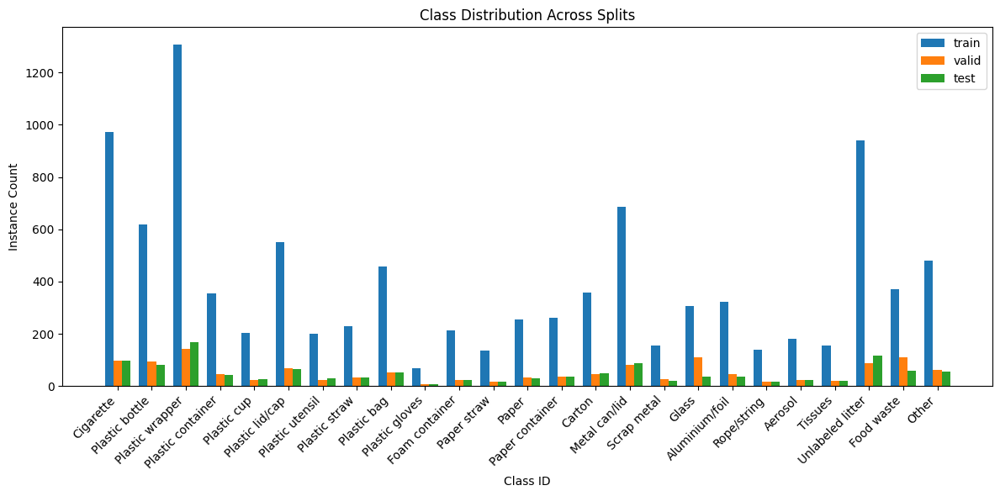

In [12]:
import os
from collections import defaultdict
import matplotlib.pyplot as plt

def get_class_distribution(labels_dir):
    class_counts = defaultdict(int)
    for fname in os.listdir(labels_dir):
        if not fname.endswith(".txt"):
            continue
        with open(os.path.join(labels_dir, fname), 'r') as f:
            for line in f:
                if line.strip():
                    cls_id = int(line.split()[0])
                    class_counts[cls_id] += 1
    return class_counts

def plot_class_distributions(base_dir, splits=["train", "valid", "test"], class_names=None):
    distributions = {}
    all_classes = set()

    # Collect distributions
    for split in splits:
        labels_dir = os.path.join(base_dir, split, "labels")
        dist = get_class_distribution(labels_dir)
        distributions[split] = dist
        all_classes.update(dist.keys())

    all_classes = sorted(list(all_classes))
    n_classes = len(all_classes)

    # Prepare data for plotting
    x = range(n_classes)
    width = 0.25

    fig, ax = plt.subplots(figsize=(12, 6))

    for i, split in enumerate(splits):
        counts = [distributions[split].get(cls, 0) for cls in all_classes]
        ax.bar([p + i*width for p in x], counts, width=width, label=split)

    # Labels for x axis
    if class_names:
        labels = [class_names[cls] if cls < len(class_names) else str(cls) for cls in all_classes]
    else:
        labels = [str(cls) for cls in all_classes]

    ax.set_xticks([p + width for p in x])
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_xlabel("Class ID")
    ax.set_ylabel("Instance Count")
    ax.set_title("Class Distribution Across Splits")
    ax.legend()
    plt.tight_layout()
    plt.show()

class_names = [id_to_name[i] for i in range(0,25)]
plot_class_distributions("TACO_dataset", class_names=class_names)


In [13]:
import yaml
# Create the data dictionary
data = {
    'train': '../train/images',
    'val': '../valid/images',
    'test': '../test/images',
    'nc': len(class_names),
    'names': class_names
}

# Custom representer to force inline list style for 'names'
class FlowStyleList(list):
    pass

def represent_flow_style_list(dumper, data):
    return dumper.represent_sequence('tag:yaml.org,2002:seq', data, flow_style=True)

yaml.add_representer(FlowStyleList, represent_flow_style_list)

# Apply the custom list wrapper
data['names'] = FlowStyleList(data['names'])

# Save to YAML file
with open('TACO_dataset/data.yaml', 'w') as file:
    yaml.dump(data, file, sort_keys=False)

In [14]:
import shutil 
shutil.rmtree('balanced_dataset')

In [15]:
import zipfile
import os

def zip_folder(folder_path, output_path):
    with zipfile.ZipFile(output_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                file_path = os.path.join(root, file)
                # Write file to zip with relative path
                arcname = os.path.relpath(file_path, start=folder_path)
                zipf.write(file_path, arcname)

# Example usage
folder_to_compress = '/kaggle/working/TACO_dataset'
zip_output = 'TACO_balanced'
zip_folder(folder_to_compress, zip_output)